In [3]:
import pandas as pd
import numpy as np


In [4]:
a = {
    "buildship": "https://github.com/eclipse/steady.git",
    "eclips-collections": "https://github.com/eclipse/eclipse-collections.git",
    "hawkbit": "https://github.com/eclipse/hawkbit.git",
    "jkube": "https://github.com/eclipse/jkube.git",
    "kura": "https://github.com/eclipse/kura.git",
    "jifa": "https://github.com/eclipse/microprofile.git",
    "milo": "https://github.com/eclipse/milo.git",
    "openvsx": "https://github.com/eclipse/openvsx.git",
    "steady": "https://github.com/eclipse/steady.git",
    "xtext": "https://github.com/eclipse/xtext.git"
}

In [7]:
# Step 3: Adjust the 'category' field based on conditions
def adjust_category(row):
    if pd.notna(row['category_df1']) and row['category_df1'] == "DOS":
        return "DOS" if pd.isna(row['category_df2']) else f"DOS,{row['category_df2']}"
    return row['category_df2'] if pd.notna(row['category_df2']) else ""


def merge_dataframes(df1, df2):
    # Step 1: Rename 'label' in df1 to 'category' for uniformity and drop 'label' from df1 if it exists
    df1 = df1.rename(columns={'label': 'category'})
    df1['category'] = df1['category'].apply(lambda x: "DOS" if x == "positive" else "")

    # Step 2: Merge the DataFrames on specified columns
    merged_df = pd.merge(df1, df2, 
                        on=["content", "method_name", "parameters", "access_modifier"], 
                        how='outer', 
                        suffixes=('_df1', '_df2'))



    

MODEl Implementation (Multi label model)

In [2]:
import ktrain
import pandas as pd
from ktrain import tabular
import numpy as np
import pandas   as pd
from sklearn.utils import shuffle
from sklearn.metrics import matthews_corrcoef, roc_auc_score
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

In [3]:
def get_model(a,project):
    # load the model
    df = pd.read_csv(f'../data/{project}_final.csv')
    # drop all rows in df
    df = df.drop(df.index)
    print(df.shape)
    for p,u in a.items():
        if p == project:
            continue
        df1 = pd.read_csv(f'../data/{p}_final.csv')
        df = pd.concat([df,df1])
    # "access_modifier","return_type","method_name","parameters","returns","comments",content,path
    df = df.drop(columns=["access_modifier","return_type","method_name","parameters","returns","comments"],axis=1)
    # Count the number of rows in the "not_smell" class
    # not_smell_count = (df['catagory'] == 'not_smell').sum()

    # # Calculate the number of rows to drop (one-third of the count)
    # rows_to_drop = not_smell_count // 3

    # # Filter the DataFrame to exclude one-third of the "not_smell" class
    # filtered_smell = df[df['catagory'] == 'not_smeel'].sample(frac=(1/3))  # Selecting 2/3 of 'not_smell' instances
    # # print(filtered_smell.shape)
    
    # defalut_smell = df[df['catagory'] != 'not_smeel']
    # print(defalut_smell.shape)
    # df = pd.concat([filtered_smell, defalut_smell])
    
    train_df = shuffle(df)
    test_df = pd.read_csv(f'../data/{project}_final.csv')
    test_df = test_df.drop(columns=["access_modifier","return_type","method_name","parameters","returns","comments"],axis=1)
    # print(df['catagory'].value_counts())
    
    # df = df.sample(frac=1).reset_index(drop=True)
    
    # np.random.seed(42)
    # p = 0.1 # 10% for test set
    # prop = 1-p
    # temp_df = df.copy()
    # msk = np.random.rand(len(temp_df)) < prop
    # train_df = temp_df[msk]
    # test_df = temp_df[~msk]
    # print(train_df["label"].value_counts())
    # print(test_df["label"].value_counts())
    test_df['index'] = test_df.index
    train_df['index'] = train_df.index  
    return train_df, test_df

In [4]:
def get_lean(train_df,test_df):
    print(test_df.iloc[1])
    trn,val,preproc = tabular.tabular_from_df(train_df, label_columns=['is','set','get','DOS'], random_state=42)
    model  = tabular.tabular_classifier(name='mlp',multilabel=True,train_data=trn,hidden_layers=[1000,1000,500],hidden_dropouts=[0.2,0.5,0.5])
    learner = ktrain.get_learner(model,train_data=trn,val_data=val,batch_size=32)
    # learner.lr_find(show_plot=True, max_epochs=5)
    data = {"get":0,"is":1,"not_LA":2,"set":3}
    print(preproc.get_classes())
    learner.fit_onecycle(5e-3, 1)
    print(learner.evaluate(val, class_names=preproc.get_classes()))
    predictor = ktrain.get_predictor(learner.model, preproc)

    
    preds = predictor.predict(test_df)
    print(preds)
    predictor.explain(test_df,row_num=1,class_id=0)
    # try:
    #     # Compute ROC curve and ROC area for each class
    #     fpr = dict()
    #     tpr = dict()
    #     roc_auc = dict()
    #     for class_name, class_idx in data.items():
    #         y_true_class = (test_df['category'] == class_name).astype(int)
    #         y_score_class = preds[:, class_idx]
    #         fpr[class_name], tpr[class_name], _ = roc_curve(y_true_class, y_score_class)
    #         roc_auc[class_name] = auc(fpr[class_name], tpr[class_name])
            
            
    #     # Plot ROC curve for each class
    #     plt.figure()
    #     for class_name, class_idx in data.items():
    #         plt.plot(fpr[class_name], tpr[class_name], label=f'ROC curve (AUC = {roc_auc[class_name]:0.2f}) for {class_name}')
    #     plt.plot([0, 1], [0, 1], 'k--')
    #     plt.xlim([0.0, 1.0])
    #     plt.ylim([0.0, 1.05])
    #     plt.xlabel('False Positive Rate')
    #     plt.ylabel('True Positive Rate')
    #     plt.title('Receiver Operating Characteristic (ROC) Curve')
    #     plt.legend(loc="lower right")
    #     plt.show()
    #     # Calculate AUC for each class

    #     auc_scores = []
    #     for class_name, class_idx in data.items():  # Iterate over each class
    #         y_true_class = (test_df['category'] == class_name).astype(int)  # Convert true labels to binary for the current class
    #         y_pred_class = preds[:, class_idx]  # Predicted probabilities for the current class
            
    #         # print(f'Class {class_name}:')
    #         # print('y_true_class:', y_true_class)
    #         # print('y_pred_class:', y_pred_class)
            
    #         auc_score = roc_auc_score(y_true_class, y_pred_class)  # Compute ROC AUC
    #         auc_scores.append(auc_score)
    #         # print(f'AUC for class {class_name}: {auc_score}')

    #     # Overall AUC can also be computed by averaging the AUC scores for each class
    #     overall_auc = np.mean(auc_scores)
    #     print(f'Overall AUC: {overall_auc}')
    #     # Calculate MCC for each class
    #     mcc_scores = []
    #     for class_name, class_idx in data.items():  # Iterate over each class
    #         y_true_class = (test_df['category'] == class_name).astype(int)  # True labels for the current class
    #         y_pred_class = np.argmax(preds, axis=1)  # Predicted labels for the current class
            
    #         # print(f'Class {class_name}:')
    #         # print('y_true_class:', y_true_class.shape)
    #         # print('y_pred_class:', y_pred_class.shape)
            
    #         # Filter y_pred_class to match the same samples as y_true_class
    #         y_pred_class_filtered = y_pred_class[test_df['category'] == class_name]
    #         # print(f"y_pred_class_filtered: {y_pred_class_filtered.shape}")
    #         mcc_score = matthews_corrcoef(y_true_class, y_pred_class)  # Compute MCC
    #         mcc_scores.append(mcc_score)
    #         print(f'MCC for class {class_name}: {mcc_score}')

    #     # Overall MCC can also be computed by averaging the MCC scores for each class
    #     overall_mcc = np.mean(mcc_scores)
    #     print(f'Overall MCC: {overall_mcc}')
    #     print(test_df.iloc[2])
    #     data = {"get":0,"is":1,"not_LA":2,"set":3}
    #     print("predict output is here")
    #     pred = predictor.predict(test_df[1:2])
    #     print(test_df.iloc[1])
    #     print(f"the prediction is {pred[0]} this")
    #     print()
    #     print()
    #     predictor.explain(test_df,row_num=1,class_id=data[pred[0]])
    # except ValueError:
    #     print(f'ValueError {ValueError}')
    
    return predictor

In [19]:
# # Function to encode categories, with handling for NaN or empty strings
# def encode_categories(row, categories):
#     if pd.isna(row) or row == "":
#         return pd.Series({category: 0 for category in categories})
#     encoded = {category: 0 for category in categories}
#     categories_in_row = str(row).split(',')  # Ensure conversion to string to handle NaNs gracefully
#     for category in categories_in_row:
#         if category in encoded:
#             encoded[category] = 1
#     return pd.Series(encoded)


In [20]:
# classes = ['is','set','get','DOS']
# for project,url in a.items():
#     df = pd.read_csv(f'../data/{project}_final.csv')
#     encoded_categories = df['category'].apply(encode_categories, categories=classes)
#     df = pd.concat([df.drop('category', axis=1), encoded_categories], axis=1)
#     df.to_csv(f'../data/{project}_final.csv', index=False)

    

In [4]:
def model_save(predictor,test_df,output_file):

    print()
    print()
    model_path = f'model/{output_file}_content_model'
    print(model_path)
    print()
    print()
    predictor.save(model_path)

the project is buildship
(0, 11)
content    private static String getArtifactUri(String g,...
is                                                         0
set                                                        0
get                                                        1
DOS                                                        0
index                                                      1
Name: 1, dtype: object
processing train: 130271 rows x 6 columns
['is', 'set', 'get', 'DOS']
       is  set  get  DOS
1120    0    0    1    1
7054    0    0    1    0
15048   1    0    0    0
83297   0    0    0    0
51467   0    0    1    0
processing test: 14267 rows x 6 columns
['is', 'set', 'get', 'DOS']
       is  set  get  DOS
10147   0    1    0    0
2805    0    0    0    0
19410   1    0    0    0
3565    0    0    0    1
6419    1    0    0    0
Is Multi-Label? True
done.
['is', 'set', 'get', 'DOS']


begin training using onecycle policy with max lr of 0.005...
446/446 [=============

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
Recall and F-score are ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
Confusion matrices do not currently support multilabel classification, so returning None


[[('is', 0.0056640534), ('set', 0.0044576405), ('get', 0.3073423), ('DOS', 0.29724565)], [('is', 0.0056642094), ('set', 0.0044577806), ('get', 0.30734283), ('DOS', 0.2972456)], [('is', 0.002357872), ('set', 0.0020930278), ('get', 0.48520315), ('DOS', 0.5493872)], [('is', 0.0061199586), ('set', 0.0051561), ('get', 0.6124862), ('DOS', 0.07864423)], [('is', 0.0061203185), ('set', 0.0051564667), ('get', 0.61248314), ('DOS', 0.07864373)], [('is', 0.05209726), ('set', 0.04918892), ('get', 0.45167175), ('DOS', 0.32909852)], [('is', 0.09853768), ('set', 0.08424504), ('get', 0.115543015), ('DOS', 0.29285127)], [('is', 0.08707016), ('set', 0.0758883), ('get', 0.54259706), ('DOS', 0.28744188)], [('is', 0.08318112), ('set', 0.07371538), ('get', 0.2446368), ('DOS', 0.2419245)], [('is', 0.08318211), ('set', 0.073715866), ('get', 0.24463248), ('DOS', 0.24192612)], [('is', 0.09886945), ('set', 0.08034238), ('get', 0.1141437), ('DOS', 0.27181855)], [('is', 0.0019959947), ('set', 0.0026328245), ('get', 

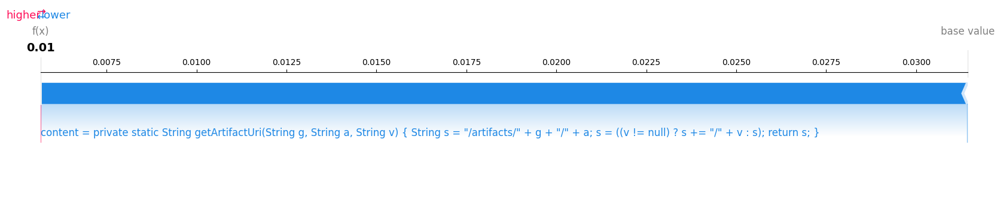

the project is eclips-collections
(0, 11)
content    { if (this == o) { return true; } if (o == nul...
is                                                         0
set                                                        0
get                                                        0
DOS                                                        1
index                                                      1
Name: 1, dtype: object
processing train: 127966 rows x 6 columns
['is', 'set', 'get', 'DOS']
       is  set  get  DOS
3373    0    0    1    0
22467   0    0    0    0
4435    0    0    0    0
66442   0    0    0    0
16426   0    0    1    0
processing test: 13982 rows x 6 columns
['is', 'set', 'get', 'DOS']
       is  set  get  DOS
11166   0    0    0    1
47195   0    0    0    0
35648   0    0    1    0
4996    0    0    1    1
68041   1    0    0    0
Is Multi-Label? True
done.
['is', 'set', 'get', 'DOS']


begin training using onecycle policy with max lr of 0.005...
437/437 [====

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
Recall and F-score are ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
Confusion matrices do not currently support multilabel classification, so returning None


[[('is', 0.08984859), ('set', 0.09569671), ('get', 0.08690341), ('DOS', 0.2747769)], [('is', 0.08985095), ('set', 0.09569654), ('get', 0.08690235), ('DOS', 0.27477318)], [('is', 0.089853294), ('set', 0.0956964), ('get', 0.08690126), ('DOS', 0.27476943)], [('is', 0.08985564), ('set', 0.09569623), ('get', 0.0869002), ('DOS', 0.27476573)], [('is', 0.089857996), ('set', 0.095696084), ('get', 0.08689912), ('DOS', 0.274762)], [('is', 0.089860335), ('set', 0.09569592), ('get', 0.08689803), ('DOS', 0.2747583)], [('is', 0.08986269), ('set', 0.09569577), ('get', 0.08689694), ('DOS', 0.27475458)], [('is', 0.08986505), ('set', 0.09569564), ('get', 0.08689588), ('DOS', 0.2747509)], [('is', 0.0898674), ('set', 0.095695466), ('get', 0.08689479), ('DOS', 0.27474713)], [('is', 0.08986973), ('set', 0.0956953), ('get', 0.08689373), ('DOS', 0.2747434)], [('is', 0.08987209), ('set', 0.09569515), ('get', 0.086892635), ('DOS', 0.27473968)], [('is', 0.08987443), ('set', 0.09569499), ('get', 0.08689157), ('DOS

divide by zero encountered in scalar divide


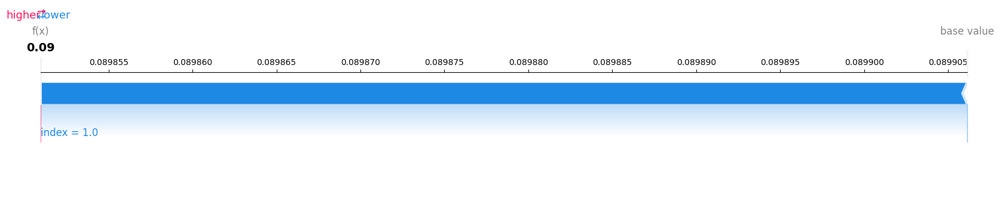

the project is jifa
(0, 11)
content    public LocalDateTime deserialize(JsonElement j...
is                                                         0
set                                                        0
get                                                        0
DOS                                                        0
index                                                      1
Name: 1, dtype: object
processing train: 133940 rows x 6 columns
['is', 'set', 'get', 'DOS']
       is  set  get  DOS
676     0    0    0    1
51507   0    0    0    0
1906    1    0    0    0
21763   0    0    1    1
38726   0    0    0    0
processing test: 14709 rows x 6 columns
['is', 'set', 'get', 'DOS']
       is  set  get  DOS
84207   0    0    0    0
27615   0    0    0    0
7339    0    0    0    0
2135    0    0    0    0
13218   0    0    0    1
Is Multi-Label? True
done.
['is', 'set', 'get', 'DOS']


begin training using onecycle policy with max lr of 0.005...
460/460 [==================

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
Recall and F-score are ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
Confusion matrices do not currently support multilabel classification, so returning None
divide by zero encountered in scalar divide


Explanation for class = is (row_num=1): 


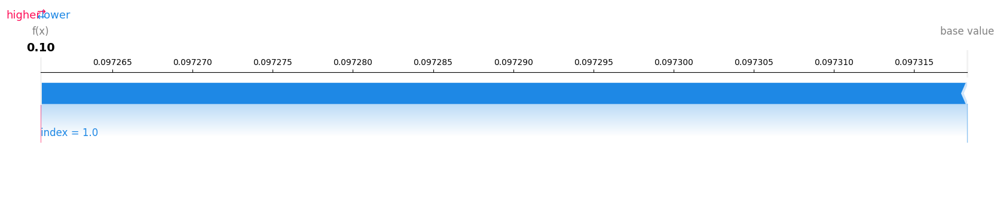

the project is jkube
(0, 11)
content    public File getManifest(KitLogger kitLogger, K...
is                                                         0
set                                                        0
get                                                        0
DOS                                                        0
index                                                      1
Name: 1, dtype: object
processing train: 131868 rows x 6 columns
['is', 'set', 'get', 'DOS']
       is  set  get  DOS
75918   0    0    1    0
32259   0    0    0    0
4804    1    0    0    0
1824    0    0    0    0
3512    0    0    1    0
processing test: 14449 rows x 6 columns
['is', 'set', 'get', 'DOS']
       is  set  get  DOS
5527    0    0    0    0
84800   0    0    1    0
1012    0    0    0    0
9616    0    0    0    0
51939   0    0    1    0
Is Multi-Label? True
done.
['is', 'set', 'get', 'DOS']


begin training using onecycle policy with max lr of 0.005...
452/452 [=================

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
Recall and F-score are ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
Confusion matrices do not currently support multilabel classification, so returning None


[[('is', 0.088942386), ('set', 0.08714932), ('get', 0.10875705), ('DOS', 0.26997855)], [('is', 0.08894353), ('set', 0.08714848), ('get', 0.10875629), ('DOS', 0.26997516)], [('is', 0.08894467), ('set', 0.08714763), ('get', 0.1087555), ('DOS', 0.26997176)], [('is', 0.08894581), ('set', 0.0871468), ('get', 0.10875473), ('DOS', 0.26996836)], [('is', 0.08894694), ('set', 0.08714594), ('get', 0.10875395), ('DOS', 0.26996493)], [('is', 0.08894807), ('set', 0.08714508), ('get', 0.10875318), ('DOS', 0.26996157)], [('is', 0.08894922), ('set', 0.087144256), ('get', 0.10875243), ('DOS', 0.26995817)], [('is', 0.08895035), ('set', 0.0871434), ('get', 0.10875161), ('DOS', 0.26995474)], [('is', 0.088951476), ('set', 0.08714254), ('get', 0.10875083), ('DOS', 0.26995137)], [('is', 0.088952586), ('set', 0.087141685), ('get', 0.10875005), ('DOS', 0.26994795)], [('is', 0.088953756), ('set', 0.08714085), ('get', 0.1087493), ('DOS', 0.26994455)], [('is', 0.08895487), ('set', 0.08713998), ('get', 0.108748525)

divide by zero encountered in scalar divide


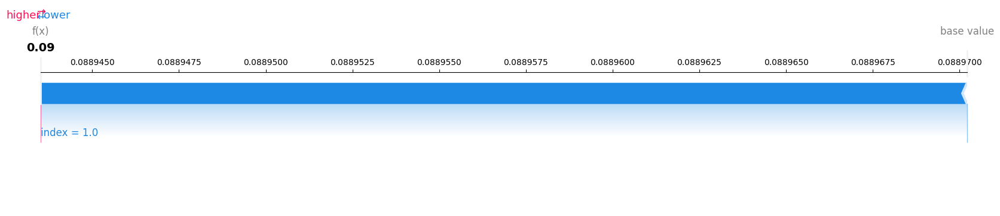

the project is hawkbit
(0, 11)
content    public boolean hasPermission(final String perm...
is                                                         0
set                                                        0
get                                                        0
DOS                                                        0
index                                                      1
Name: 1, dtype: object
processing train: 131797 rows x 6 columns
['is', 'set', 'get', 'DOS']
       is  set  get  DOS
25415   1    0    0    0
14153   0    0    0    0
3435    0    0    0    0
21792   0    0    1    0
2645    0    0    0    0
processing test: 14443 rows x 6 columns
['is', 'set', 'get', 'DOS']
       is  set  get  DOS
13045   1    0    0    0
37007   0    0    0    0
26351   0    0    0    0
8529    0    0    0    1
2241    0    0    1    0
Is Multi-Label? True
done.
['is', 'set', 'get', 'DOS']


begin training using onecycle policy with max lr of 0.005...
452/452 [===============

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
Recall and F-score are ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
Confusion matrices do not currently support multilabel classification, so returning None


[[('is', 0.0955758), ('set', 0.07499113), ('get', 0.12632374), ('DOS', 0.2707541)], [('is', 0.09557747), ('set', 0.07499133), ('get', 0.12632045), ('DOS', 0.2707501)], [('is', 0.09557913), ('set', 0.074991554), ('get', 0.12631716), ('DOS', 0.2707461)], [('is', 0.09558078), ('set', 0.07499183), ('get', 0.12631387), ('DOS', 0.2707421)], [('is', 0.09558244), ('set', 0.07499205), ('get', 0.12631057), ('DOS', 0.27073812)], [('is', 0.09558411), ('set', 0.074992284), ('get', 0.1263073), ('DOS', 0.27073413)], [('is', 0.09558576), ('set', 0.07499252), ('get', 0.126304), ('DOS', 0.27073014)], [('is', 0.095587425), ('set', 0.07499275), ('get', 0.12630072), ('DOS', 0.2707261)], [('is', 0.09558908), ('set', 0.07499299), ('get', 0.12629738), ('DOS', 0.27072215)], [('is', 0.095590726), ('set', 0.07499323), ('get', 0.12629414), ('DOS', 0.27071816)], [('is', 0.09559239), ('set', 0.07499345), ('get', 0.12629084), ('DOS', 0.27071416)], [('is', 0.09559405), ('set', 0.0749937), ('get', 0.12628753), ('DOS',

divide by zero encountered in scalar divide


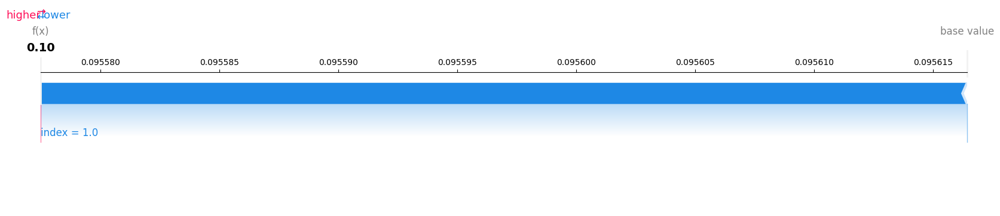

the project is kura
(0, 11)
content    { int cnt = 0; LastError=0; int SizeAvail; boo...
is                                                         0
set                                                        0
get                                                        0
DOS                                                        0
index                                                      1
Name: 1, dtype: object
processing train: 116511 rows x 6 columns
['is', 'set', 'get', 'DOS']
       is  set  get  DOS
88231   0    0    1    0
83903   0    0    0    0
11131   0    0    0    1
4994    0    0    0    1
41675   0    0    0    0
processing test: 12664 rows x 6 columns
['is', 'set', 'get', 'DOS']
       is  set  get  DOS
9684    0    0    0    1
2202    0    0    1    0
74372   0    0    0    0
540     0    0    0    1
28940   0    0    1    0
Is Multi-Label? True
done.
['is', 'set', 'get', 'DOS']


begin training using onecycle policy with max lr of 0.005...
396/396 [==================

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
Recall and F-score are ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
Confusion matrices do not currently support multilabel classification, so returning None


[[('is', 0.073723905), ('set', 0.060226273), ('get', 0.1114735), ('DOS', 0.29283157)], [('is', 0.07372383), ('set', 0.060226243), ('get', 0.11147369), ('DOS', 0.29283172)], [('is', 0.07372376), ('set', 0.060226195), ('get', 0.11147392), ('DOS', 0.29283184)], [('is', 0.07372372), ('set', 0.06022611), ('get', 0.11147408), ('DOS', 0.29283202)], [('is', 0.07372365), ('set', 0.060226068), ('get', 0.11147427), ('DOS', 0.29283214)], [('is', 0.07372358), ('set', 0.060226005), ('get', 0.111474454), ('DOS', 0.29283226)], [('is', 0.07372348), ('set', 0.060225964), ('get', 0.11147467), ('DOS', 0.29283243)], [('is', 0.07372344), ('set', 0.060225923), ('get', 0.11147486), ('DOS', 0.29283255)], [('is', 0.073723376), ('set', 0.060225837), ('get', 0.11147504), ('DOS', 0.29283273)], [('is', 0.07372332), ('set', 0.06022579), ('get', 0.11147525), ('DOS', 0.29283285)], [('is', 0.07372325), ('set', 0.060225748), ('get', 0.11147542), ('DOS', 0.292833)], [('is', 0.073723175), ('set', 0.060225684), ('get', 0.1

divide by zero encountered in scalar divide


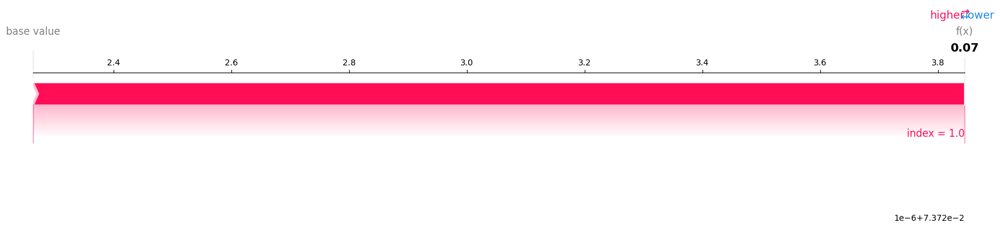

the project is milo
(0, 11)
content    private CompletableFuture<List<NodeId>> browse...
is                                                         0
set                                                        0
get                                                        0
DOS                                                        0
index                                                      1
Name: 1, dtype: object
processing train: 125494 rows x 6 columns
['is', 'set', 'get', 'DOS']
       is  set  get  DOS
73000   0    0    0    0
6062    0    0    0    1
63411   0    0    1    0
16765   0    0    0    0
75153   0    0    0    0
processing test: 13701 rows x 6 columns
['is', 'set', 'get', 'DOS']
       is  set  get  DOS
48226   1    0    0    0
18513   0    0    0    0
794     0    0    0    0
10546   0    0    1    0
36291   0    0    0    0
Is Multi-Label? True
done.
['is', 'set', 'get', 'DOS']


begin training using onecycle policy with max lr of 0.005...
429/429 [==================

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
Recall and F-score are ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
Confusion matrices do not currently support multilabel classification, so returning None


[[('is', 0.09307686), ('set', 0.061581284), ('get', 0.11629633), ('DOS', 0.29705286)], [('is', 0.093078494), ('set', 0.061581828), ('get', 0.11629417), ('DOS', 0.29704803)], [('is', 0.09308014), ('set', 0.061582383), ('get', 0.11629203), ('DOS', 0.2970432)], [('is', 0.09308177), ('set', 0.061582934), ('get', 0.11628993), ('DOS', 0.29703838)], [('is', 0.093083404), ('set', 0.06158346), ('get', 0.116287775), ('DOS', 0.29703355)], [('is', 0.093085036), ('set', 0.06158401), ('get', 0.11628562), ('DOS', 0.29702872)], [('is', 0.09308666), ('set', 0.06158456), ('get', 0.11628348), ('DOS', 0.29702392)], [('is', 0.093088314), ('set', 0.061585084), ('get', 0.11628134), ('DOS', 0.2970191)], [('is', 0.093089946), ('set', 0.06158562), ('get', 0.11627922), ('DOS', 0.29701427)], [('is', 0.09309158), ('set', 0.06158616), ('get', 0.11627707), ('DOS', 0.29700944)], [('is', 0.093093224), ('set', 0.06158671), ('get', 0.11627494), ('DOS', 0.2970046)], [('is', 0.09309484), ('set', 0.06158726), ('get', 0.116

divide by zero encountered in scalar divide


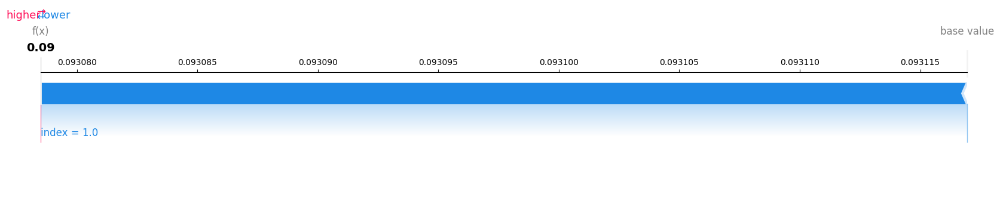

the project is openvsx
(0, 11)
content    private String apiCall(String path) { return "...
is                                                         0
set                                                        0
get                                                        0
DOS                                                        0
index                                                      1
Name: 1, dtype: object
processing train: 131918 rows x 6 columns
['is', 'set', 'get', 'DOS']
       is  set  get  DOS
5766    0    0    0    0
80924   0    0    1    0
5399    0    0    0    1
35563   0    0    0    0
1942    1    0    0    0
processing test: 14455 rows x 6 columns
['is', 'set', 'get', 'DOS']
       is  set  get  DOS
93      0    0    0    0
71573   1    0    0    0
70266   0    0    0    0
3609    0    0    1    0
75201   0    0    0    0
Is Multi-Label? True
done.
['is', 'set', 'get', 'DOS']


begin training using onecycle policy with max lr of 0.005...
452/452 [===============

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
Recall and F-score are ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
Confusion matrices do not currently support multilabel classification, so returning None


[[('is', 0.08886306), ('set', 0.08418006), ('get', 0.13124141), ('DOS', 0.2844164)], [('is', 0.0888649), ('set', 0.08417999), ('get', 0.13123947), ('DOS', 0.2844112)], [('is', 0.08886671), ('set', 0.08417993), ('get', 0.13123755), ('DOS', 0.28440607)], [('is', 0.08886854), ('set', 0.084179856), ('get', 0.13123563), ('DOS', 0.28440088)], [('is', 0.08887038), ('set', 0.0841798), ('get', 0.13123375), ('DOS', 0.2843957)], [('is', 0.08887222), ('set', 0.08417972), ('get', 0.13123184), ('DOS', 0.28439054)], [('is', 0.08887405), ('set', 0.08417967), ('get', 0.1312299), ('DOS', 0.28438535)], [('is', 0.08887586), ('set', 0.08417962), ('get', 0.131228), ('DOS', 0.2843802)], [('is', 0.08887768), ('set', 0.08417954), ('get', 0.1312261), ('DOS', 0.284375)], [('is', 0.08887951), ('set', 0.08417948), ('get', 0.13122414), ('DOS', 0.28436986)], [('is', 0.08888134), ('set', 0.08417943), ('get', 0.13122222), ('DOS', 0.28436467)], [('is', 0.088883154), ('set', 0.084179364), ('get', 0.13122031), ('DOS', 0.

divide by zero encountered in scalar divide


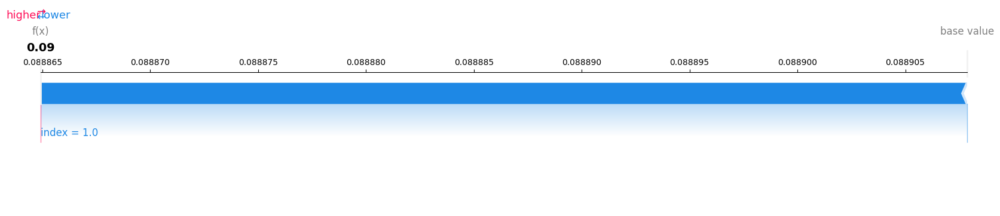

the project is steady
(0, 11)
content    private static String getArtifactUri(String g,...
is                                                         0
set                                                        0
get                                                        0
DOS                                                        0
index                                                      1
Name: 1, dtype: object
processing train: 129643 rows x 6 columns
['is', 'set', 'get', 'DOS']
       is  set  get  DOS
51095   0    0    0    0
294     0    0    0    1
240     0    1    0    0
74907   0    0    0    0
80298   1    0    0    0
processing test: 14188 rows x 6 columns
['is', 'set', 'get', 'DOS']
       is  set  get  DOS
90207   0    0    1    0
11900   0    0    0    1
35948   0    0    1    0
70141   0    0    1    0
29778   1    0    0    0
Is Multi-Label? True
done.
['is', 'set', 'get', 'DOS']


begin training using onecycle policy with max lr of 0.005...
444/444 [================

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
Recall and F-score are ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
Confusion matrices do not currently support multilabel classification, so returning None


[[('is', 0.08350381), ('set', 0.080525346), ('get', 0.10484404), ('DOS', 0.29028553)], [('is', 0.08350704), ('set', 0.08052706), ('get', 0.10484229), ('DOS', 0.29027888)], [('is', 0.09146294), ('set', 0.07767872), ('get', 0.21503155), ('DOS', 0.23198861)], [('is', 0.025813874), ('set', 0.032939695), ('get', 0.43713477), ('DOS', 0.371965)], [('is', 0.025816327), ('set', 0.032941774), ('get', 0.43713486), ('DOS', 0.37196139)], [('is', 0.008030954), ('set', 0.0121910665), ('get', 0.46566564), ('DOS', 0.457298)], [('is', 0.051706463), ('set', 0.040529657), ('get', 0.50829685), ('DOS', 0.14820102)], [('is', 0.072190635), ('set', 0.056599725), ('get', 0.5172355), ('DOS', 0.16169406)], [('is', 0.029053373), ('set', 0.020182146), ('get', 0.50491077), ('DOS', 0.11361857)], [('is', 0.029053662), ('set', 0.020182164), ('get', 0.5049095), ('DOS', 0.11361848)], [('is', 0.09476207), ('set', 0.08005279), ('get', 0.20381199), ('DOS', 0.22958153)], [('is', 0.078599274), ('set', 0.078757234), ('get', 0.

divide by zero encountered in scalar divide


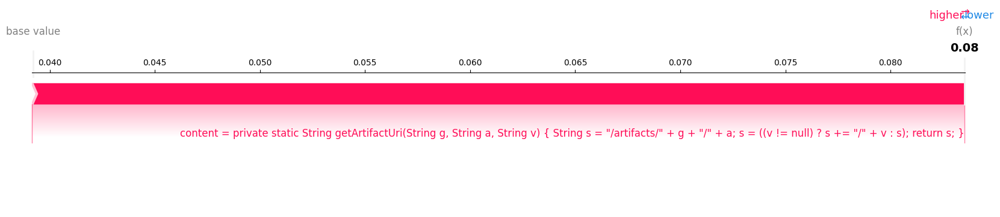

the project is xtext
(0, 11)
content    public IEditorDescriptor[] overrideEditors(Str...
is                                                         0
set                                                        0
get                                                        0
DOS                                                        1
index                                                      1
Name: 1, dtype: object
processing train: 52702 rows x 6 columns
['is', 'set', 'get', 'DOS']
       is  set  get  DOS
5563    0    1    0    0
15877   0    0    0    0
3062    0    0    0    1
10216   0    1    0    0
2864    0    0    0    0
processing test: 5803 rows x 6 columns
['is', 'set', 'get', 'DOS']
       is  set  get  DOS
5187    0    0    0    0
9248    0    0    0    0
14652   0    0    0    0
918     0    0    0    1
19758   0    0    0    0
Is Multi-Label? True
done.
['is', 'set', 'get', 'DOS']


begin training using onecycle policy with max lr of 0.005...
182/182 [===================

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
Recall and F-score are ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
Confusion matrices do not currently support multilabel classification, so returning None


[[('is', 0.05232526), ('set', 0.052265685), ('get', 0.10062389), ('DOS', 0.3961921)], [('is', 0.052338112), ('set', 0.052282736), ('get', 0.10063162), ('DOS', 0.39610016)], [('is', 0.052350994), ('set', 0.052299805), ('get', 0.10063929), ('DOS', 0.39600822)], [('is', 0.05236387), ('set', 0.052316893), ('get', 0.10064702), ('DOS', 0.39591628)], [('is', 0.052376736), ('set', 0.052333962), ('get', 0.10065474), ('DOS', 0.39582434)], [('is', 0.052389614), ('set', 0.052351046), ('get', 0.10066245), ('DOS', 0.3957324)], [('is', 0.052402508), ('set', 0.052368123), ('get', 0.100670174), ('DOS', 0.3956405)], [('is', 0.052415386), ('set', 0.05238521), ('get', 0.10067791), ('DOS', 0.39554855)], [('is', 0.05242827), ('set', 0.052402306), ('get', 0.10068562), ('DOS', 0.39545664)], [('is', 0.052441176), ('set', 0.0524194), ('get', 0.10069332), ('DOS', 0.3953648)], [('is', 0.052454066), ('set', 0.05243653), ('get', 0.10070104), ('DOS', 0.39527288)], [('is', 0.05246695), ('set', 0.05245364), ('get', 0.

divide by zero encountered in scalar divide


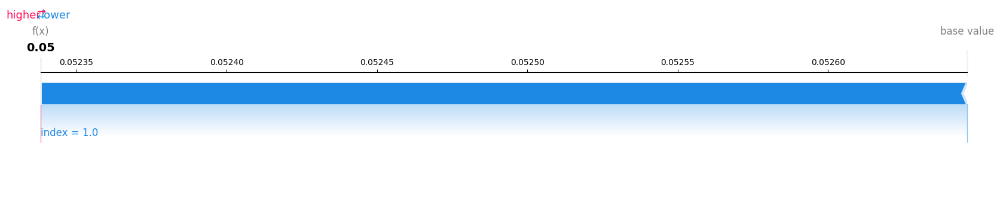

In [6]:
a = {
    "buildship": " ", 
    "eclips-collections": " ",
    "jifa": " ",
    "jkube": " ",
    "hawkbit": "https://github.com/eclipse/hawkbit.git",
    "kura": "https://github.com/eclipse/kura.git",
    "milo": "https://github.com/eclipse/milo.git",
    "openvsx": "https://github.com/eclipse/openvsx.git",
    "steady": "https://github.com/eclipse/steady.git",
    "xtext": "https://github.com/eclipse/xtext.git"
}
for project,url in a.items():
    print(f"the project is {project}")
    train_df,test_df = get_model(a,project)
    predictor = get_lean(train_df,test_df)
    # model_save(predictor,test_df,project)